In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('media prediction and its cost.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               60428 non-null  object 
 1   food_department             60428 non-null  object 
 2   food_family                 60428 non-null  object 
 3   store_sales(in millions)    60428 non-null  float64
 4   store_cost(in millions)     60428 non-null  float64
 5   unit_sales(in millions)     60428 non-null  float64
 6   promotion_name              60428 non-null  object 
 7   sales_country               60428 non-null  object 
 8   marital_status              60428 non-null  object 
 9   gender                      60428 non-null  object 
 10  total_children              60428 non-null  float64
 11  education                   60428 non-null  object 
 12  member_card                 60428 non-null  object 
 13  occupation                  604

In [ ]:
df.head()

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,...,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
0,Breakfast Foods,Frozen Foods,Food,7.36,2.7232,4.0,Bag Stuffers,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",126.62
1,Breakfast Foods,Frozen Foods,Food,5.52,2.5944,3.0,Cash Register Lottery,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",59.86
2,Breakfast Foods,Frozen Foods,Food,3.68,1.3616,2.0,High Roller Savings,USA,S,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,"Daily Paper, Radio",84.16
3,Breakfast Foods,Frozen Foods,Food,3.68,1.1776,2.0,Cash Register Lottery,USA,M,F,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,In-Store Coupon,95.78
4,Breakfast Foods,Frozen Foods,Food,4.08,1.4280,3.0,Double Down Sale,USA,M,M,...,18670.0,5415.0,3610.0,1.0,1.0,1.0,1.0,1.0,Radio,50.79


Kita akan fokus pada data yang berada di USA

In [ ]:

df_usa = df.loc[df['sales_country']=='USA']
df_usa = df_usa.drop(['sales_country'], axis =1)
df_usa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38892 entries, 0 to 60425
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               38892 non-null  object 
 1   food_department             38892 non-null  object 
 2   food_family                 38892 non-null  object 
 3   store_sales(in millions)    38892 non-null  float64
 4   store_cost(in millions)     38892 non-null  float64
 5   unit_sales(in millions)     38892 non-null  float64
 6   promotion_name              38892 non-null  object 
 7   marital_status              38892 non-null  object 
 8   gender                      38892 non-null  object 
 9   total_children              38892 non-null  float64
 10  education                   38892 non-null  object 
 11  member_card                 38892 non-null  object 
 12  occupation                  38892 non-null  object 
 13  houseowner                  388

Data Cleaning


In [ ]:
df_usa.isnull().sum()

food_category                 0
food_department               0
food_family                   0
store_sales(in millions)      0
store_cost(in millions)       0
unit_sales(in millions)       0
promotion_name                0
marital_status                0
gender                        0
total_children                0
education                     0
member_card                   0
occupation                    0
houseowner                    0
avg_cars_at home(approx)      0
avg. yearly_income            0
num_children_at_home          0
avg_cars_at home(approx).1    0
brand_name                    0
SRP                           0
gross_weight                  0
net_weight                    0
recyclable_package            0
low_fat                       0
units_per_case                0
store_type                    0
store_city                    0
store_state                   0
store_sqft                    0
grocery_sqft                  0
frozen_sqft                   0
meat_sqf

Data Sudah bersih, sehingga tidak perlu melakukan cleaning

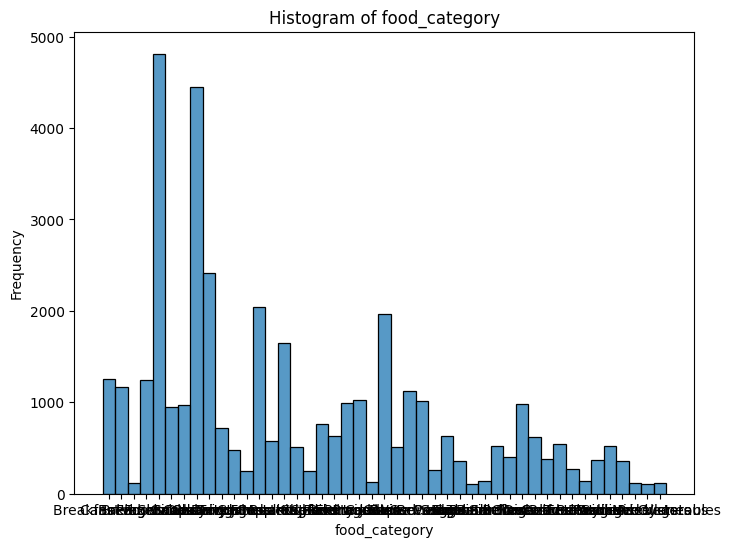

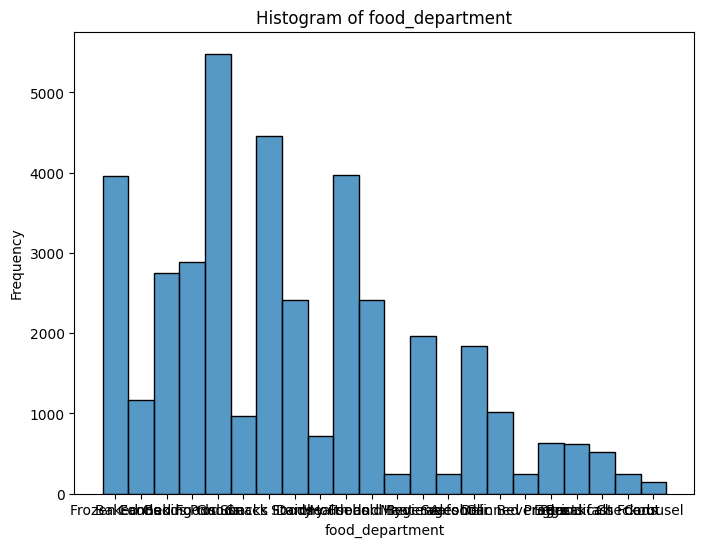

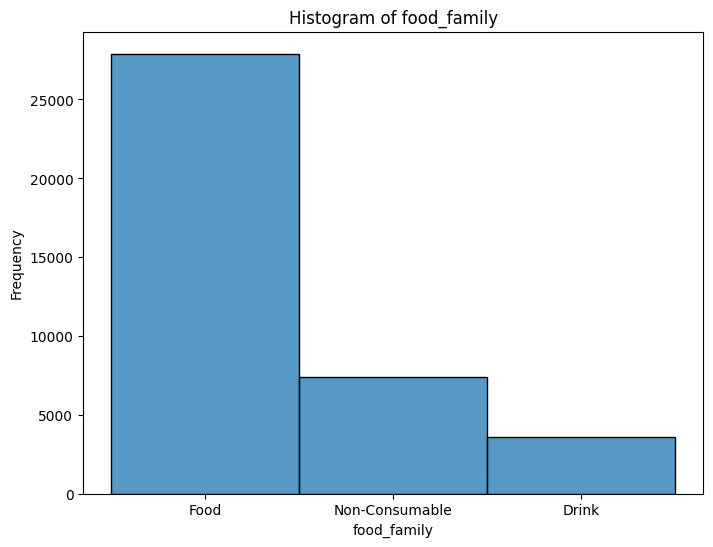

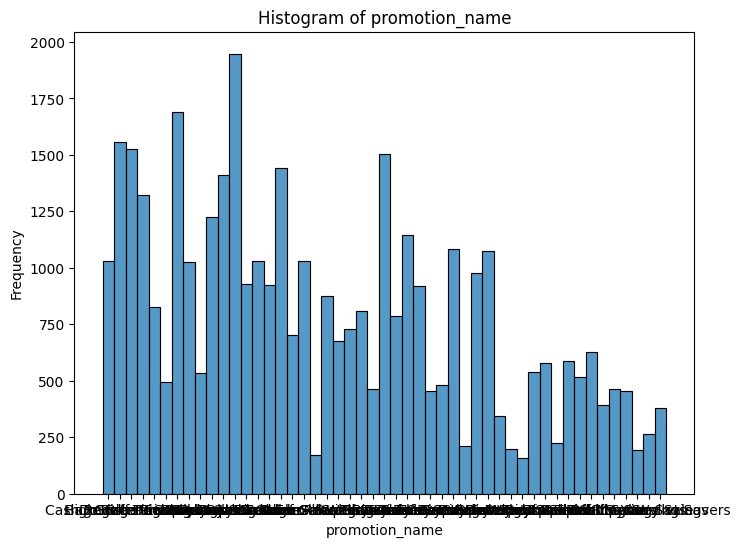

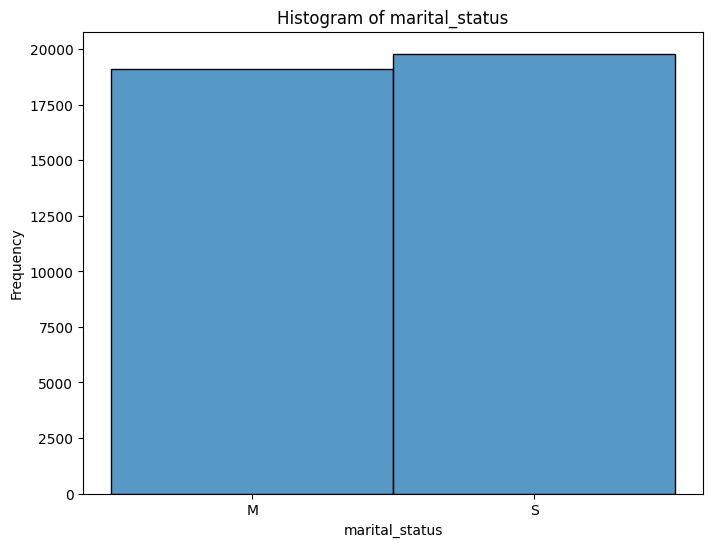

...

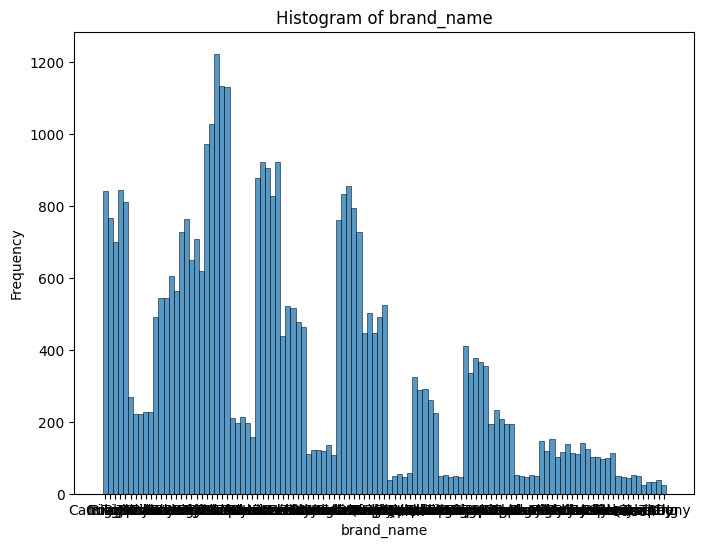

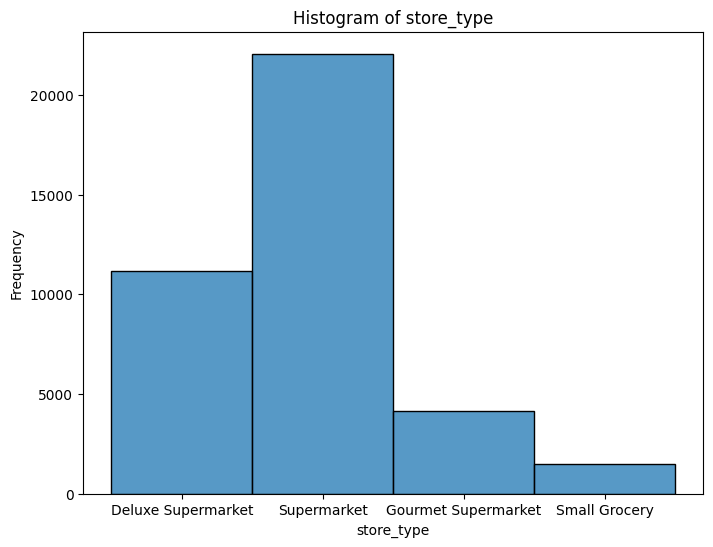

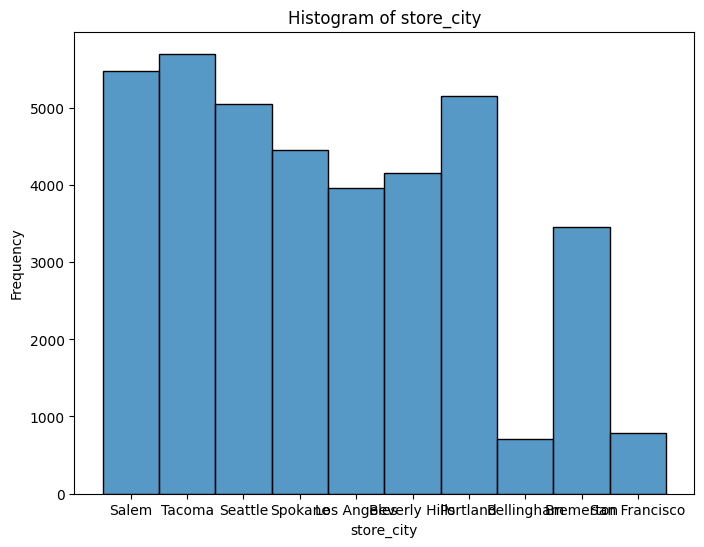

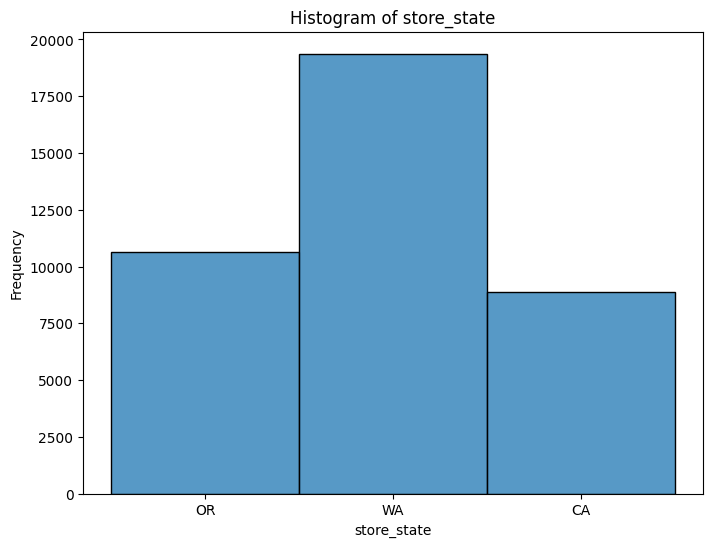

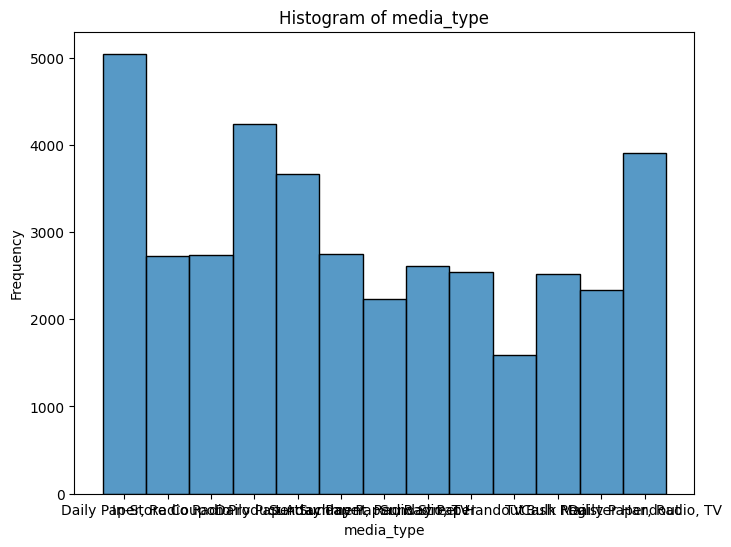

food_category         None
food_department       None
food_family           None
promotion_name        None
marital_status        None
gender                None
education             None
member_card           None
occupation            None
houseowner            None
avg. yearly_income    None
brand_name            None
store_type            None
store_city            None
store_state           None
media_type            None
dtype: object

In [ ]:
object_cols = df_usa.select_dtypes('object').columns
def visualize_categorical_column(column_data, col_name):
    plt.figure(figsize=(8, 6))
    sns.histplot(column_data)
    plt.xlabel(col_name)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col_name}')
    plt.show()
df_usa[object_cols].apply(lambda x: visualize_categorical_column(x, col_name=x.name), axis=0)

<ipython-input-7-42ae015f9841>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=df_usa.corr(), annot=True)


<Axes: >

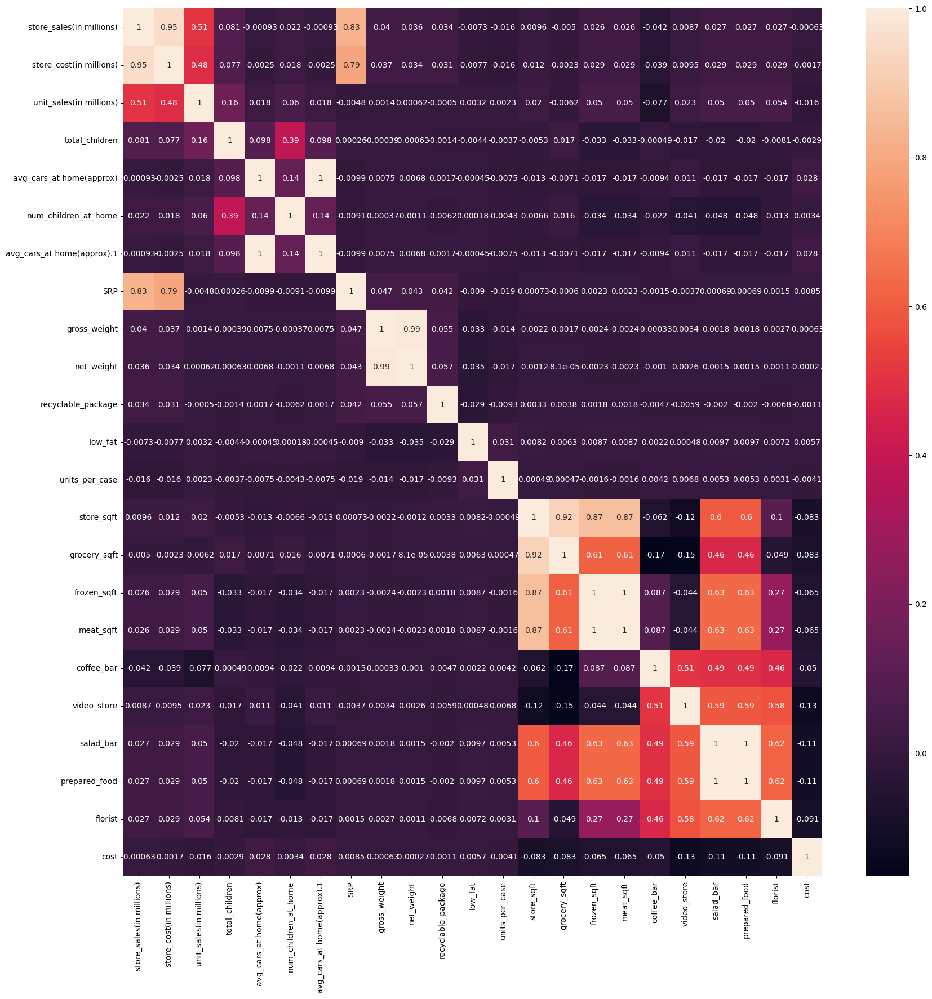

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(data=df_usa.corr(), annot=True)

Karena kita akan prediksi cost yang dibutuhkan untuk mendapatkan customer, maka kita bisa drop data mengenai store







In [ ]:
column = ['store_sales(in millions)', 'store_cost(in millions)', 'store_sqft' ]
df2 = df_usa.drop(column, axis=1)
df_usa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38892 entries, 0 to 60425
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               38892 non-null  object 
 1   food_department             38892 non-null  object 
 2   food_family                 38892 non-null  object 
 3   store_sales(in millions)    38892 non-null  float64
 4   store_cost(in millions)     38892 non-null  float64
 5   unit_sales(in millions)     38892 non-null  float64
 6   promotion_name              38892 non-null  object 
 7   marital_status              38892 non-null  object 
 8   gender                      38892 non-null  object 
 9   total_children              38892 non-null  float64
 10  education                   38892 non-null  object 
 11  member_card                 38892 non-null  object 
 12  occupation                  38892 non-null  object 
 13  houseowner                  388

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38892 entries, 0 to 60425
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               38892 non-null  object 
 1   food_department             38892 non-null  object 
 2   food_family                 38892 non-null  object 
 3   unit_sales(in millions)     38892 non-null  float64
 4   promotion_name              38892 non-null  object 
 5   marital_status              38892 non-null  object 
 6   gender                      38892 non-null  object 
 7   total_children              38892 non-null  float64
 8   education                   38892 non-null  object 
 9   member_card                 38892 non-null  object 
 10  occupation                  38892 non-null  object 
 11  houseowner                  38892 non-null  object 
 12  avg_cars_at home(approx)    38892 non-null  float64
 13  avg. yearly_income          388

karena kita melakukan prediksi pada cost yang dibutuhkan untuk mendapatkan customer, kita dapat drop data pribadi customer yang tidak relevan

In [ ]:
column = ['gender', 'total_children', 'marital_status','num_children_at_home', 'education', 'avg_cars_at home(approx)', 'avg. yearly_income', 'occupation', 'houseowner', 'avg_cars_at home(approx).1']
df3 = df2.drop(column, axis=1)
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38892 entries, 0 to 60425
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   food_category            38892 non-null  object 
 1   food_department          38892 non-null  object 
 2   food_family              38892 non-null  object 
 3   unit_sales(in millions)  38892 non-null  float64
 4   promotion_name           38892 non-null  object 
 5   member_card              38892 non-null  object 
 6   brand_name               38892 non-null  object 
 7   SRP                      38892 non-null  float64
 8   gross_weight             38892 non-null  float64
 9   net_weight               38892 non-null  float64
 10  recyclable_package       38892 non-null  float64
 11  low_fat                  38892 non-null  float64
 12  units_per_case           38892 non-null  float64
 13  store_type               38892 non-null  object 
 14  store_city            

kita dapat drop juga data mengenai makanan yang tidak relevan

In [ ]:
column = ['food_category', 'food_department', 'food_family','brand_name', 'recyclable_package', 'low_fat']
df4 = df3.drop(column, axis=1)
df4.info()
# df4.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38892 entries, 0 to 60425
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   unit_sales(in millions)  38892 non-null  float64
 1   promotion_name           38892 non-null  object 
 2   member_card              38892 non-null  object 
 3   SRP                      38892 non-null  float64
 4   gross_weight             38892 non-null  float64
 5   net_weight               38892 non-null  float64
 6   units_per_case           38892 non-null  float64
 7   store_type               38892 non-null  object 
 8   store_city               38892 non-null  object 
 9   store_state              38892 non-null  object 
 10  grocery_sqft             38892 non-null  float64
 11  frozen_sqft              38892 non-null  float64
 12  meat_sqft                38892 non-null  float64
 13  coffee_bar               38892 non-null  float64
 14  video_store           

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

target = 'cost'
features = ['member_card', 'SRP', 'gross_weight', 'net_weight', 'units_per_case', 'store_type', 'store_city', 'store_state', 'grocery_sqft', 'frozen_sqft', 'meat_sqft', 'coffee_bar',
            'video_store', 'salad_bar', 'prepared_food', 'florist', 'media_type', 'cost']

df4[target] = label_encoder.fit_transform(df4[target])

for feature in features:
    if df4[feature].dtype == 'object':
        df4[feature] = label_encoder.fit_transform(df4[feature])

<ipython-input-14-469a2dacba27>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data=df4.corr(), annot=True)


<Axes: >

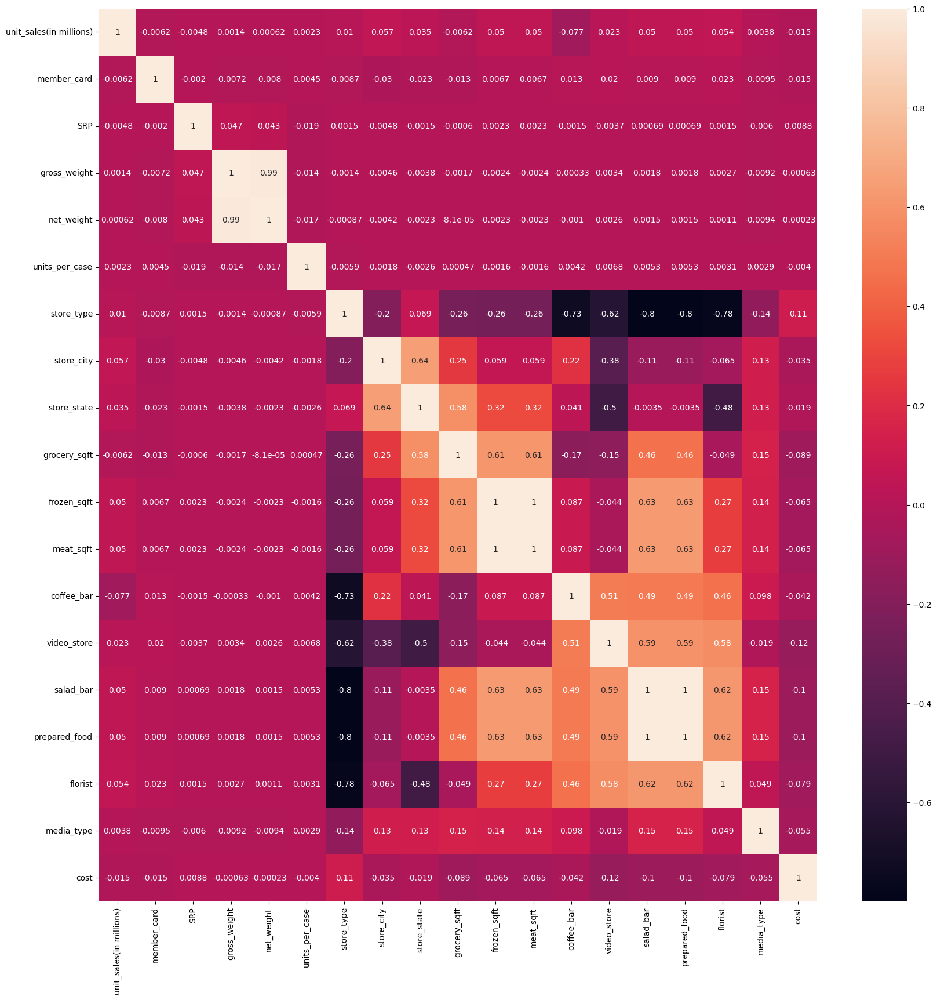

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(data=df4.corr(), annot=True)

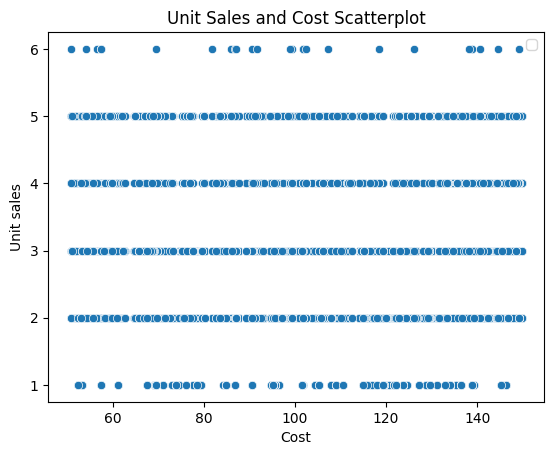

In [ ]:
sns.scatterplot(x=df['cost'], y=df['unit_sales(in millions)'])
plt.xlabel('Cost')
plt.ylabel('Unit sales')
plt.title('Unit Sales and Cost Scatterplot')
plt.legend()
plt.show()

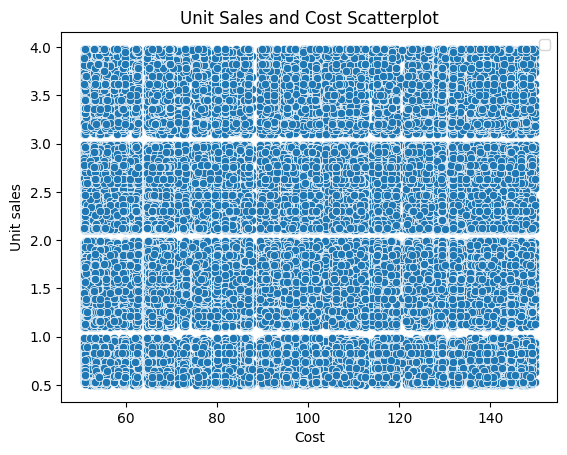

In [ ]:
sns.scatterplot(x=df['cost'], y=df['SRP'])
plt.xlabel('Cost')
plt.ylabel('Unit sales')
plt.title('Unit Sales and Cost Scatterplot')
plt.legend()
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

X = df4[features]
Y = df4[target]
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.4, random_state=999)

In [ ]:
from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor()
model.fit(x_train, y_train)
y_pred_decision = model.predict(x_test)
model_test_mse = mean_squared_error(y_test, y_pred_decision)
model_test_rmse = np.sqrt(model_test_mse)
DecisionTree_r2_test = model.score(np.array(x_test), y_test)
print('rmse test: ', model_test_rmse)
print('y test mean: ', y_test.mean())
print('r2 score: ', DecisionTree_r2_test)

rmse test:  0.0
y test mean:  100.89850228193096
r2 score:  1.0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [ ]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor()
model.fit(x_train, y_train)
y_pred_random = model.predict(x_test)
model_test_mse = mean_squared_error(y_test, y_pred_random)
model_test_rmse = np.sqrt(model_test_mse)
RandomForest_r2_test = model.score(np.array(x_test), y_test)
print('rmse test: ', model_test_rmse)
print('y test mean: ', y_test.mean())
print('r2 score: ', RandomForest_r2_test)

rmse test:  0.00041659970321757887
y test mean:  100.89850228193096
r2 score:  0.9999999999573936


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
random_grid = {
    'max_depth' : [20,30,50],
    'max_features' : [4,6,10],
    'min_samples_leaf' : [2,3,4],
    'min_samples_split' : [2,3,4]

}

In [ ]:
forest_grid = RandomizedSearchCV(estimator = model, param_distributions=random_grid)
forest_grid.fit(np.array(x_train), y_train)

RandomizedSearchCV(estimator=RandomForestRegressor(),
                   param_distributions={'max_depth': [20, 30, 50],
                                        'max_features': [4, 6, 10],
                                        'min_samples_leaf': [2, 3, 4],
                                        'min_samples_split': [2, 3, 4]})

In [ ]:
forest_grid.best_params_

{'min_samples_split': 4,
 'min_samples_leaf': 2,
 'max_features': 10,
 'max_depth': 30}

In [ ]:
model = RandomForestRegressor(min_samples_split= 4,
 min_samples_leaf= 3,
 max_features= 10,
 max_depth = 30)
model.fit(x_train, y_train)
y_pred_random = model.predict(x_test)
model_test_mse = mean_squared_error(y_test, y_pred_random)
model_test_rmse = np.sqrt(model_test_mse)
RandomForest_r2_test = model.score(np.array(x_test), y_test)
print('rmse test: ', model_test_rmse)
print('y test mean: ', y_test.mean())
print('r2 score: ', RandomForest_r2_test)

rmse test:  0.17542230703814882
y test mean:  100.89850228193096
r2 score:  0.9999924454870215


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
df_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_random})
df_results

,Actual,Predicted
33530,94,94.000000
45252,81,80.821810
39165,206,205.955000
2034,66,66.000000
55162,105,104.663333
...,...,...
32524,196,196.000000
44504,79,78.897619
35289,179,178.972222
19967,23,23.000000


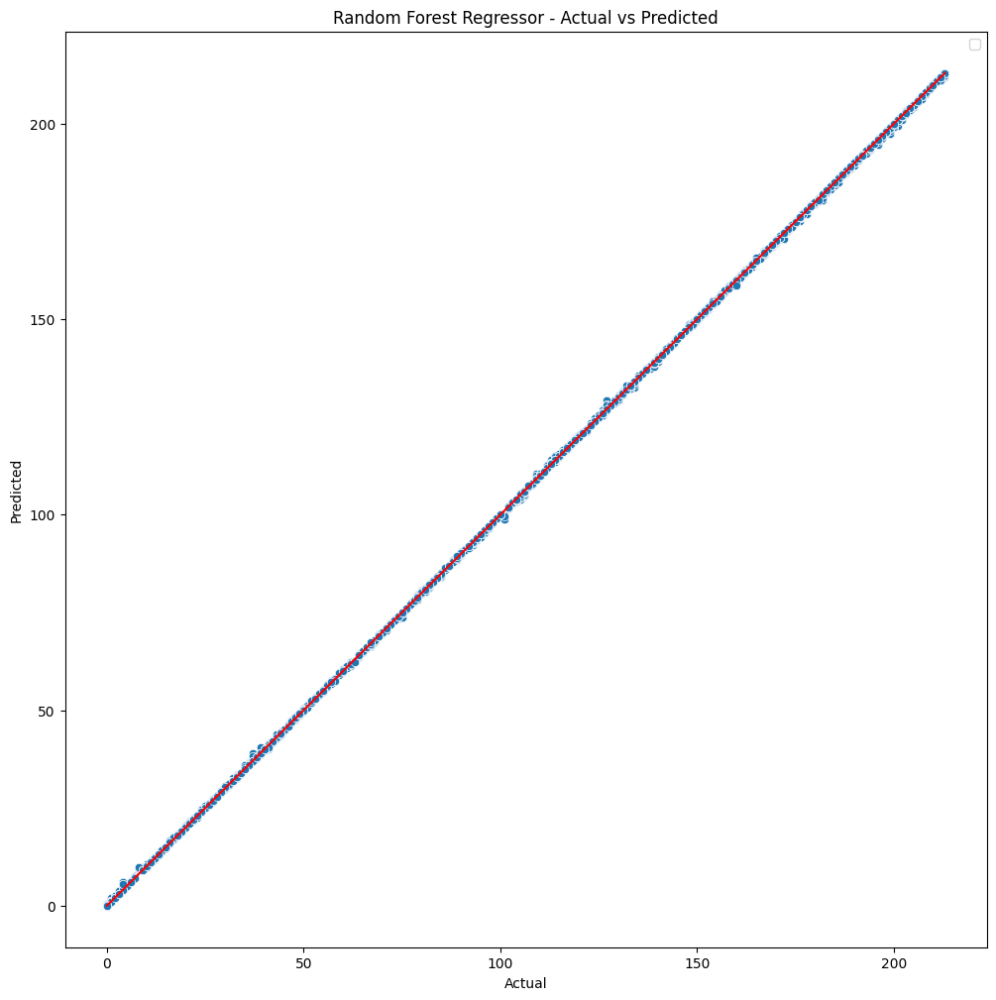

In [ ]:
plt.figure(figsize=(12, 12))
sns.scatterplot(x=df_results['Actual'], y=df_results['Predicted'], alpha=1)
plt.plot([min(df_results['Actual']), max(df_results['Actual'])], [min(df_results['Predicted']), max(df_results['Predicted'])], color='red')
plt.title('Random Forest Regressor - Actual vs Predicted')
plt.legend()
plt.show()

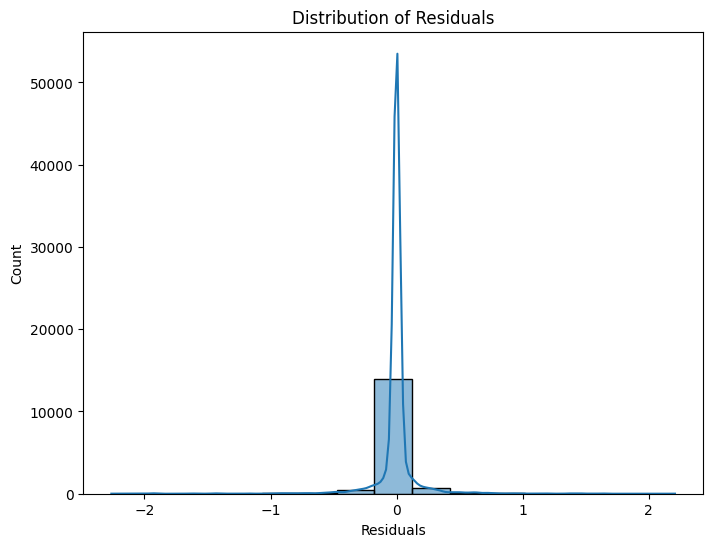

In [ ]:
residuals = y_test - y_pred_random
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Count')
plt.show()

In [ ]:
from sklearn.tree import plot_tree

model = RandomForestRegressor(min_samples_split=4, min_samples_leaf=3, max_features=10, max_depth=30)
model.fit(x_train, y_train)

plt.figure(figsize=(300, 300))
plot_tree(model.estimators_[0], feature_names=x_train.columns, filled=True)
plt.show()

In [ ]:
model = RandomForestRegressor(min_samples_split=4, min_samples_leaf=3, max_features=10, max_depth=30)
model.fit(x_train, y_train)

# Visualisasi salah satu pohon dalam model Random Forest
plt.figure(figsize=(12, 8))
tree = model.estimators_[0]  # Mengambil salah satu pohon keputusan dari model
feature_names = list(x_train.columns)  # Nama-nama fitur
target_name = "Target"  # Nama target
# Plot pohon keputusan
_ = tree.plot_tree(tree, feature_names=feature_names, class_names=target_name, filled=True)
plt.show()